In [1]:
from utils import show_task_activation, plot_fmap
from utils import process_gray_matter_mask, create_4d_volume, create_events_df, compute_task_fmap, compute_bins_threshold
from utils import subject_gm_mask_path, paradigm_dir, subject_task_active_mask_path, subject_task_regressor_path, subject_task_sample_prefix
from utils import mkdir_no_exist, x_coords, y_coords, z_coords
from utils import resample_mask, get_atlas_activation, get_subject_ids
from utils import voxel_activation_glm, regressors_to_binary_design
from utils import create_labeled_sample, create_active_voxel_mask



from viz import plot_voxel_timecourse


from matplotlib.backends.backend_pdf import PdfPages
import os
from os.path import join as pjoin
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from glob import glob
import xarray as xr

import nibabel as nib
from nilearn import image
from nilearn.image import resample_to_img
from nilearn.glm import threshold_stats_img
from nilearn.glm.first_level import FirstLevelModel, run_glm
from nilearn.plotting import (
    plot_design_matrix,
    plot_stat_map,
    plot_img,
    plot_glass_brain,
)

In [4]:
HCP_dir = '/media/miplab-nas2/HCP-Data'
paradigm_dir = pjoin(HCP_dir,'HCP_100unrelated_TaskParadigms')
fMRI_dir = pjoin(HCP_dir,'HCP_100unrelated_preprocessed_ERG/data')

project_dir = '/media/RCPNAS/Data2/CS-433-ML4S/'
project_data_dir = pjoin(project_dir, 'data')
project_dataset_dir = pjoin(project_dir, "dataset")

derivatives_dir = pjoin(project_data_dir, 'derivatives')
anat_dir = pjoin(derivatives_dir, 'anat')
func_dir = pjoin(derivatives_dir, 'func')
events_dir = pjoin(project_data_dir, 'events')

mkdir_no_exist(anat_dir)
mkdir_no_exist(func_dir)
mkdir_no_exist(events_dir)
mkdir_no_exist(project_dataset_dir)

In [5]:
subject = "127630"
task = "LANGAUGE"
acq = "RL"
smoothing = 10
TR = 0.72 

In [6]:
def subject_run(sid, acquisition, task=task):
    return {"id": sid, "acquisition": acquisition, 'task':task}

In [7]:
def binary_design_matrix(events_df, TR, n_volumes):
    time_points = np.arange(0, n_volumes * TR, TR)
    conditions = sorted(events_df['trial_type'].unique())
    design_matrix = pd.DataFrame(0, index=time_points, columns=conditions)
    
    for _, event in events_df.iterrows():
        start_idx = np.searchsorted(time_points, event['onset'])
        end_idx = np.searchsorted(time_points, event['onset'] + event['duration'])
        design_matrix.iloc[start_idx:end_idx, conditions.index(event['trial_type'])] = 1
    
    return design_matrix

In [8]:
def get_predicted_bold_response(glm, active_mask_data, binary_design_matrix,original_data):    
    predicted = glm.predicted[0]
    predicted_data = predicted.get_fdata()[active_mask_data > 0]
    print(predicted_data.shape)

    plot_voxel_timecourse(predicted_data, binary_design_matrix)

    _=0
    timepoints = original_data.shape[-1]
    original_data_masked = original_data[active_mask_data > 0].reshape(-1,timepoints)

    return original_data_masked,predicted_data,_

def get_predicted_neural_activity(glm, active_mask_data, binary_design_matrix,original_data):
    n_volumes, n_regressors = glm.design_matrices_[0].shape
    n_conditions = n_regressors - 1 # drop constant regressor
    contrast_matrix = np.eye(n_conditions, n_regressors)

    # actual response (amplitude) in the voxel for each of the n_conditions
    betas_data = glm.compute_contrast(contrast_matrix, output_type='effect_size').get_fdata()
    active_voxel_beta = betas_data[active_mask_data > 0].reshape(-1, n_conditions)

    predicted_neural_activity =  active_voxel_beta @ binary_design_matrix.T.to_numpy()

    print(predicted_neural_activity.shape)
    plot_voxel_timecourse(predicted_neural_activity, binary_design_matrix)
    
    _=0
    timepoints = original_data.shape[-1]
    original_data_masked = original_data[active_mask_data > 0].reshape(-1,timepoints)

    return original_data_masked,predicted_neural_activity,_

def get_predicted_neural_activity_per_condition(glm, active_mask_data, binary_design_matrix,original_data):
    print(binary_design_matrix.shape)
    
    n_volumes, n_regressors = glm.design_matrices_[0].shape
    n_conditions = n_regressors - 1 # drop constant regressor
    contrast_matrix = np.eye(n_conditions, n_regressors)
    
    betas = activity_glm.compute_contrast(contrast_matrix, output_type='effect_size')
    betas_data = betas.get_fdata()
    active_voxel_beta = betas_data[active_mask_data > 0].reshape(-1, n_conditions)
    
    # binary_design: (T × C) = (284 × 10)
    # betas: (V × C) = (1937 × 10)
    # out output: (C × T × V) = (10 × 284 × 1937) beta for each condition for each ts for each voxel_activiy
    
    predictions = np.zeros((
        n_conditions,       # C = 10
        active_voxel_beta.shape[0],   # V = 1937
        n_volumes,       # T = 284
    ))

    binary_design_matrix = binary_design_matrix.to_numpy()
    for c in range(n_conditions):
        # binary_design[:, c] is (T,)
        # betas[:, c] is (V,)
        # outer product to get (T × V) for this condition
        # basically I want to be able to separate betas across condition (skip '@' = Sum_i beta_i cond_i)
        predictions[c] = np.outer(active_voxel_beta[:, c], binary_design_matrix[:, c])
    
    timepoints = original_data.shape[-1]
    original_data_masked = original_data[active_mask_data > 0].reshape(-1,timepoints)
    return original_data_masked,predictions,_

def get_block_and_neural_activity(glm, active_mask_data, binary_design_matrix,original_data):
    n_volumes, n_regressors = glm.design_matrices_[0].shape
    n_conditions = n_regressors - 1 # drop constant regressor
    contrast_matrix = np.eye(n_conditions, n_regressors)

    # actual response (amplitude) in the voxel for each of the n_conditions
    betas_data = glm.compute_contrast(contrast_matrix, output_type='effect_size').get_fdata()
    active_voxel_beta = betas_data[active_mask_data > 0].reshape(-1, n_conditions)

    predicted_neural_activity =  active_voxel_beta @ binary_design_matrix.T.to_numpy()

    print(predicted_neural_activity.shape)
    plot_voxel_timecourse(predicted_neural_activity, binary_design_matrix)
    predicted = glm.predicted[0]
    predicted_data = predicted.get_fdata()[active_mask_data > 0]
    print(predicted_data.shape)

    plot_voxel_timecourse(predicted_data, binary_design_matrix)

    timepoints = original_data.shape[-1]
    original_data_masked = original_data[active_mask_data > 0].reshape(-1,timepoints)

    return original_data_masked,predicted_neural_activity,predicted_data

In [9]:
types_acq = ['RL','LR']
sub_list = get_subject_ids(paradigm_dir)
print(sub_list)

['100307', '100408', '101107', '101309', '101915', '103111', '103414', '103818', '105014', '105115', '106016', '108828', '110411', '111312', '111716', '113619', '113922', '114419', '115320', '116524', '117122', '118528', '118730', '118932', '120111', '122317', '122620', '123117', '123925', '124422', '125525', '126325', '127630', '127933', '128127', '128632', '129028', '130013', '130316', '131217', '131722', '133019', '133928', '135225', '135932', '136833', '138534', '139637', '140925', '144832', '146432', '147737', '148335', '148840', '149337', '149539', '149741', '151223', '151526', '151627', '153025', '154734', '156637', '159340', '160123', '161731', '162733', '163129', '176542', '178950', '188347', '189450', '190031', '192540', '196750', '198451', '199655', '201111', '208226', '211417', '211720', '212318', '214423', '221319', '239944', '245333', '280739', '298051', '366446', '397760', '414229', '499566', '654754', '672756', '751348', '756055', '792564', '856766', '857263', '899885']

In [10]:
subjects = [subject_run(sub, type_acq) for sub in sub_list for type_acq in types_acq]
print(subjects[0])

{'id': '100307', 'acquisition': 'RL', 'task': 'LANGAUGE'}


In [11]:
import pandas as pd
df = pd.read_csv(pjoin(derivatives_dir, f'sorted_subjects_{task}.csv'))

FileNotFoundError: [Errno 2] No such file or directory: '/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/sorted_subjects_LANGAUGE.csv'

In [ ]:
df.head()

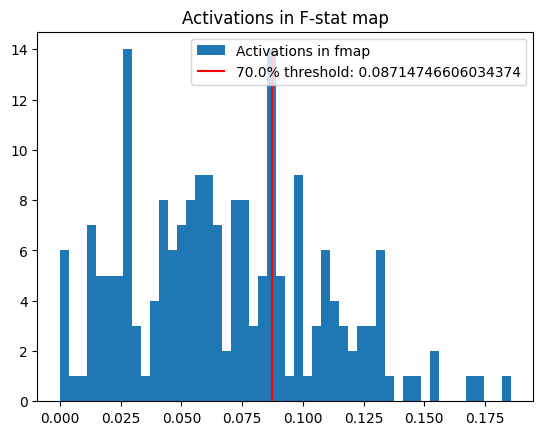

In [11]:
keep_quantile=0.7 # Keep only % of observations
plt.hist(df['activation'],bins=50,label='Activations in fmap')
thr=np.quantile(df['activation'],keep_quantile)
plt.vlines(thr,0,14,color='red',label=f'{keep_quantile*100}% threshold: {thr}')
plt.title('Activations in F-stat map')
plt.legend()
plt.show()

In [12]:
keep_df = df[df['activation']>thr]

In [13]:
keep_df.tail()

,activation,subject,task,acquisition
55,0.088727,113922,MOTOR,RL
56,0.088498,499566,MOTOR,LR
57,0.087811,196750,MOTOR,LR
58,0.087468,103111,MOTOR,RL
59,0.087468,148335,MOTOR,LR


In [14]:
subjects_kept=[]
for entry in keep_df.itertuples():
    subjects_kept.append(subject_run(sid=entry.subject,acquisition=entry.acquisition,task=entry.task))

In [15]:
len(subjects_kept)

60

Processing subject 0 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/118932_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/118932_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/118932_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 118932_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/118932_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/118932_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/118932_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1959, 284)


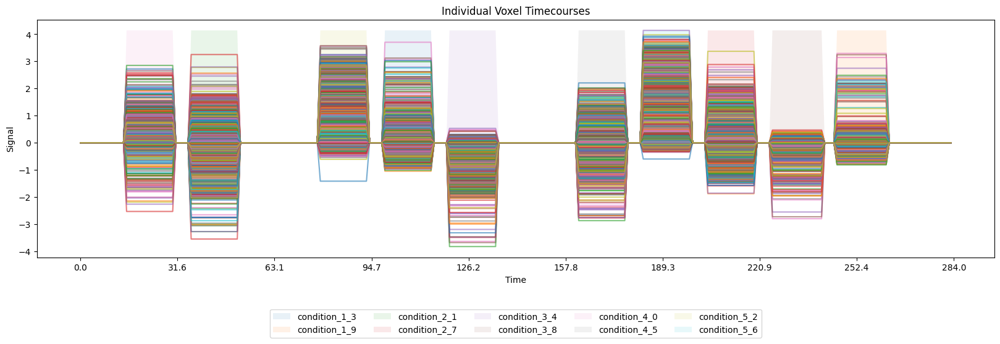

(1959, 284)


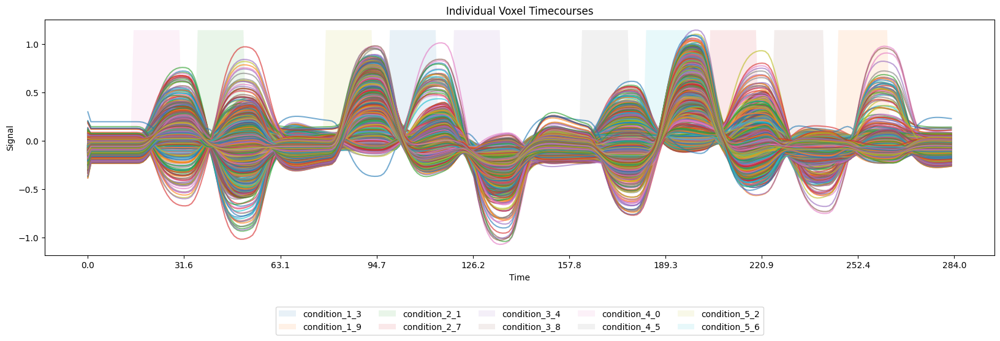

Processing subject 1 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/113619_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/113619_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/113619_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 113619_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/113619_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/113619_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/113619_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1930, 284)


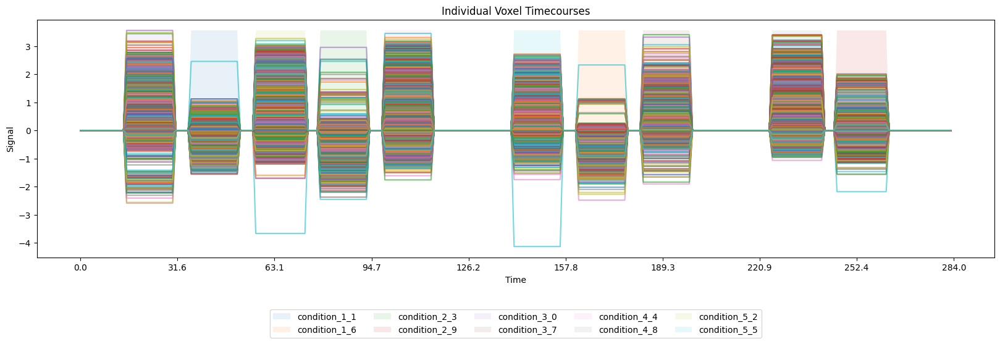

(1930, 284)


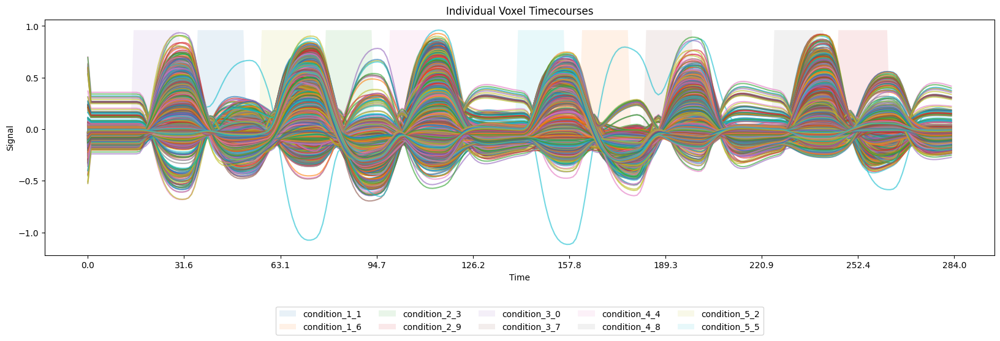

Processing subject 2 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/211417_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/211417_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/211417_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 211417_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/211417_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/211417_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/211417_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1939, 284)


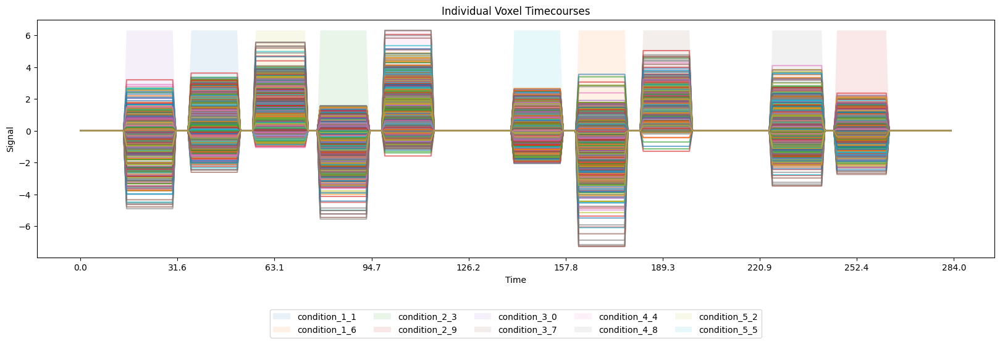

(1939, 284)


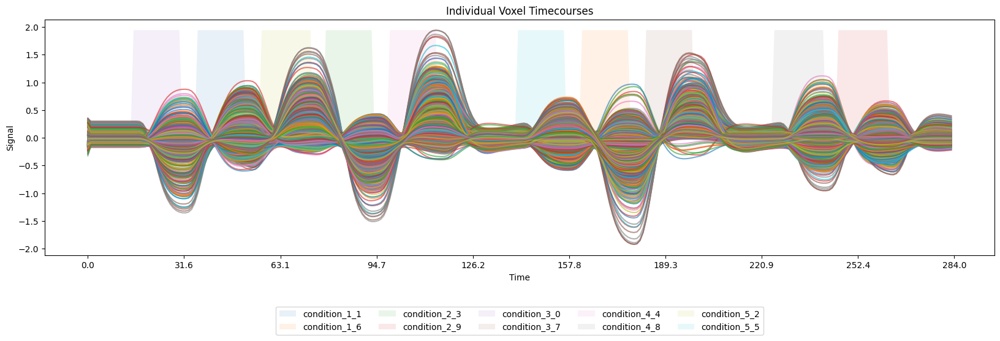

Processing subject 3 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/239944_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/239944_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/239944_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 239944_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/239944_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/239944_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/239944_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1924, 284)


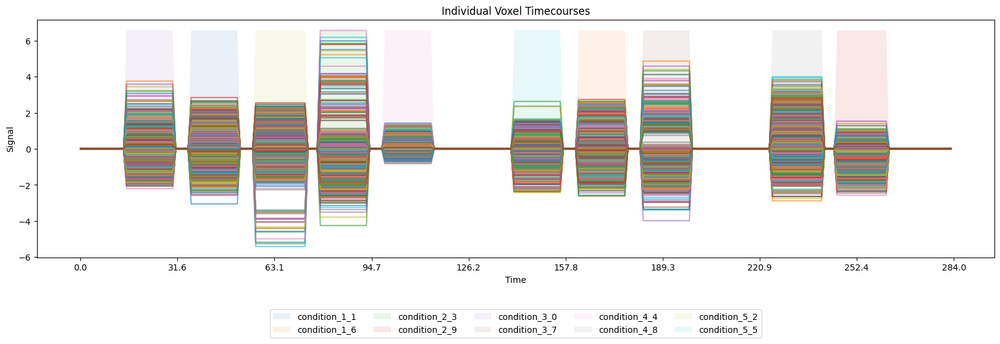

(1924, 284)


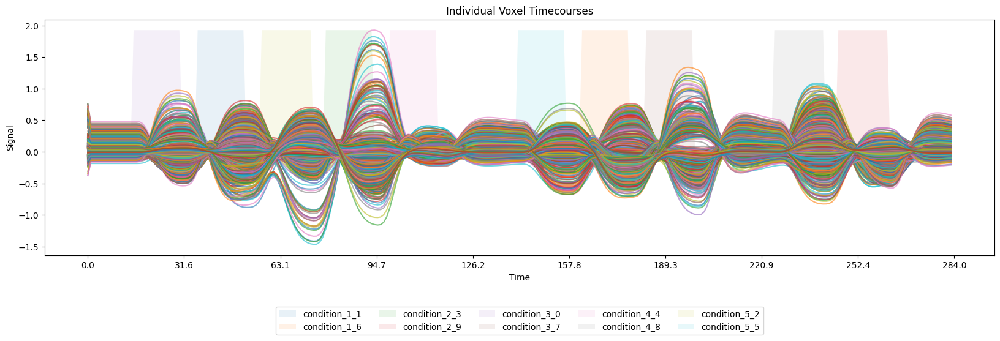

Processing subject 4 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/103818_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/103818_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/103818_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 103818_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/103818_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/103818_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/103818_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1943, 284)


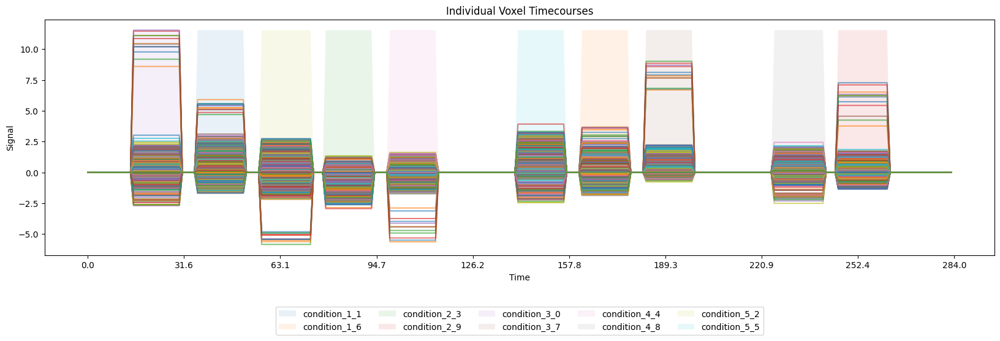

(1943, 284)


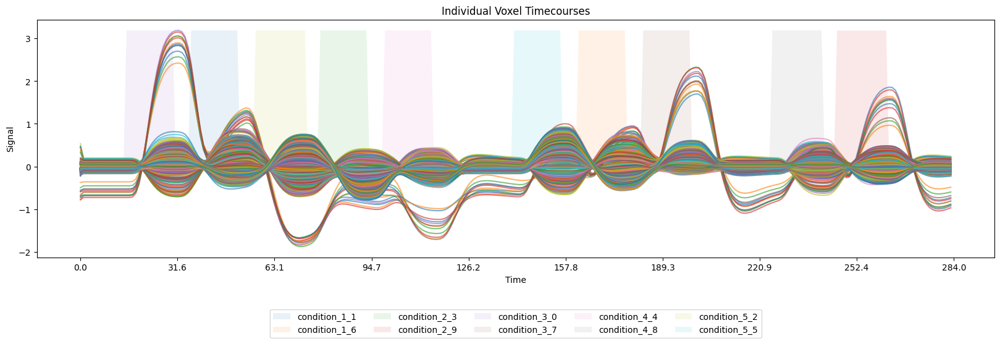

Processing subject 5 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/149741_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/149741_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/149741_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 149741_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/149741_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/149741_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/149741_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1945, 284)


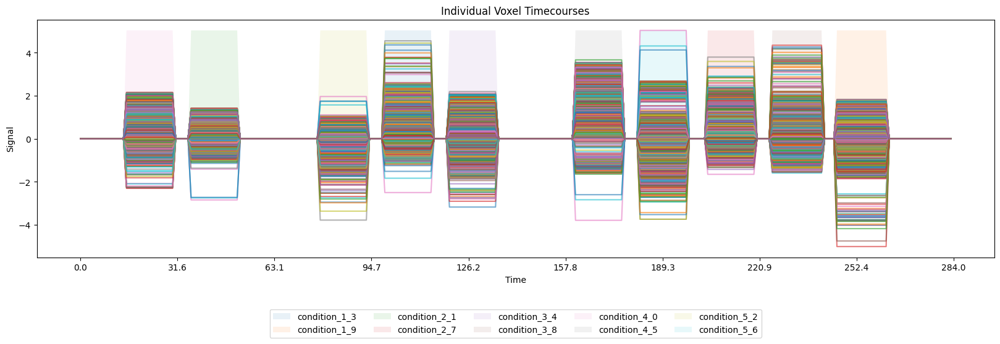

(1945, 284)


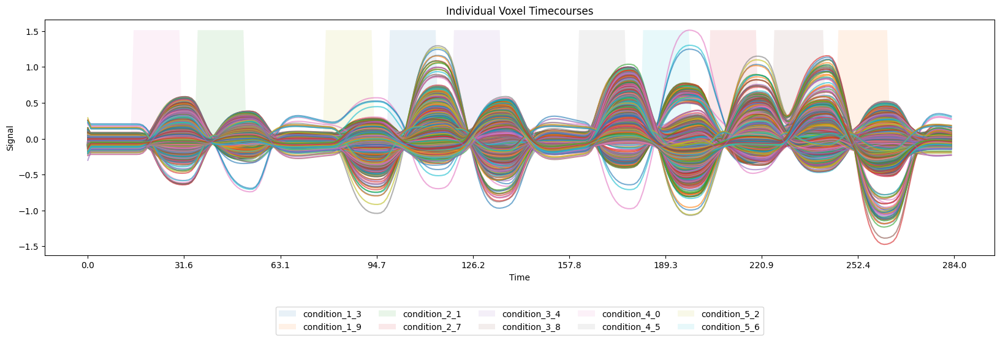

Processing subject 6 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/113619_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/113619_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/113619_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 113619_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/113619_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/113619_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/113619_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1930, 284)


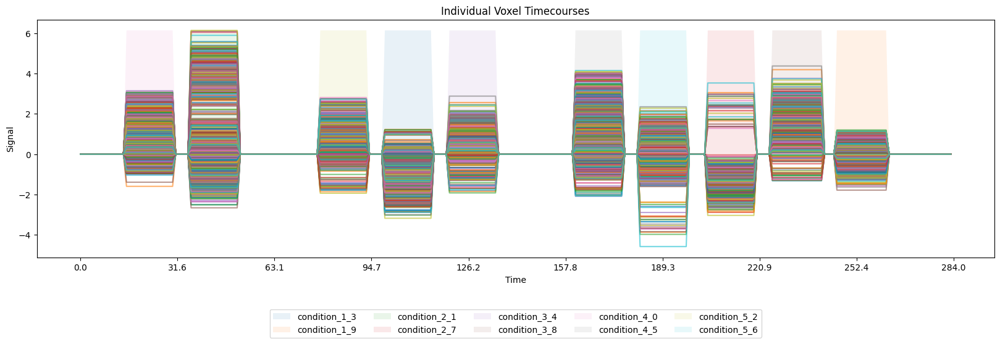

(1930, 284)


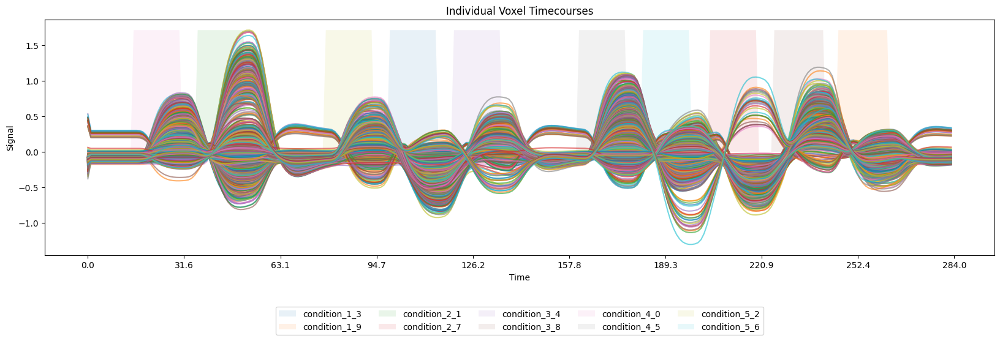

Processing subject 7 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/101915_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/101915_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/101915_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 101915_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/101915_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/101915_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/101915_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1922, 284)


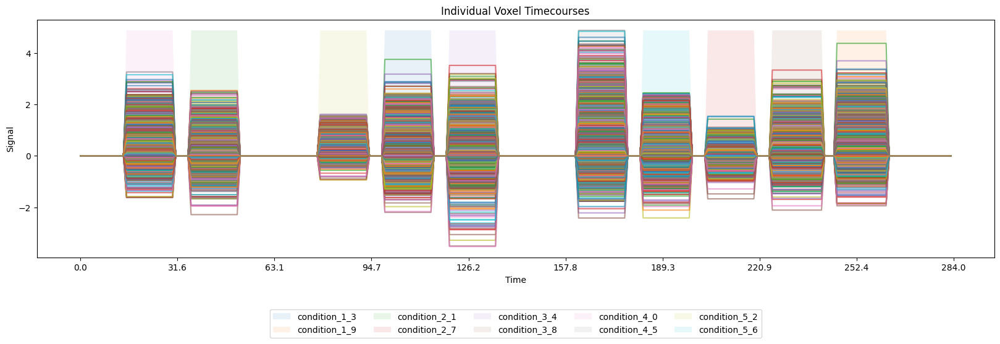

(1922, 284)


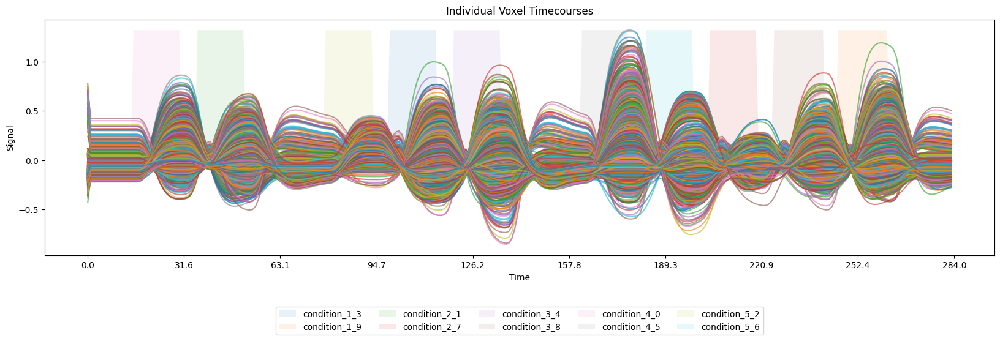

Processing subject 8 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/118528_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/118528_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/118528_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 118528_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/118528_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/118528_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/118528_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1931, 284)


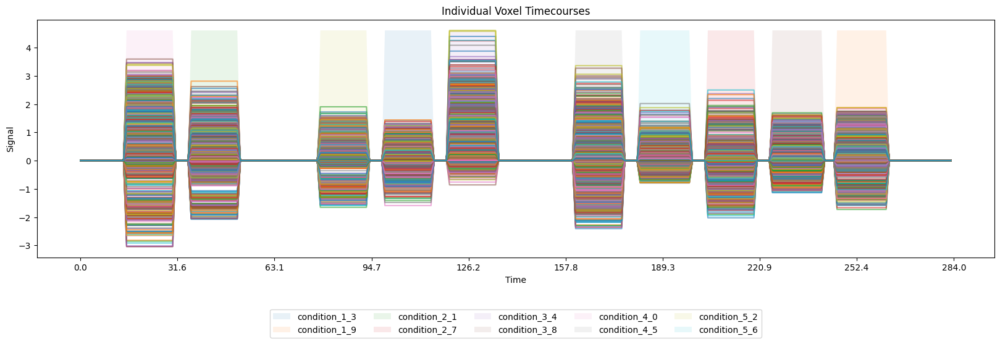

(1931, 284)


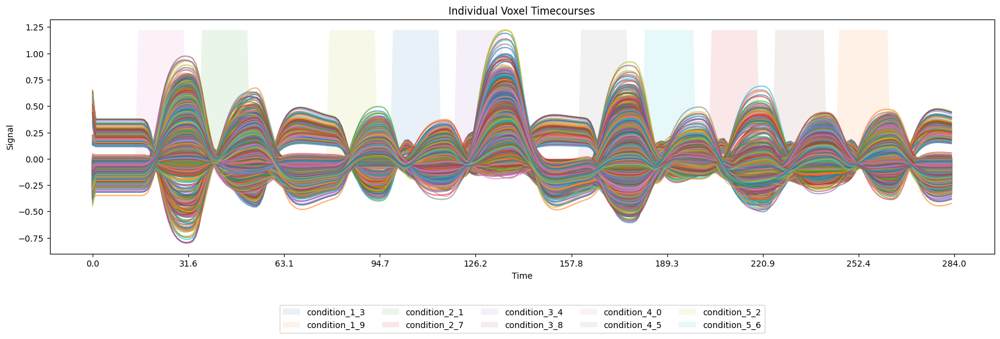

Processing subject 9 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/298051_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/298051_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/298051_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 298051_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/298051_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/298051_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/298051_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1884, 284)


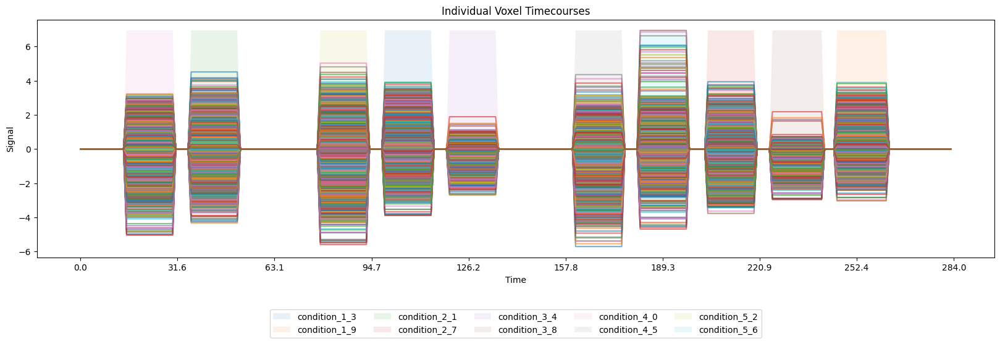

(1884, 284)


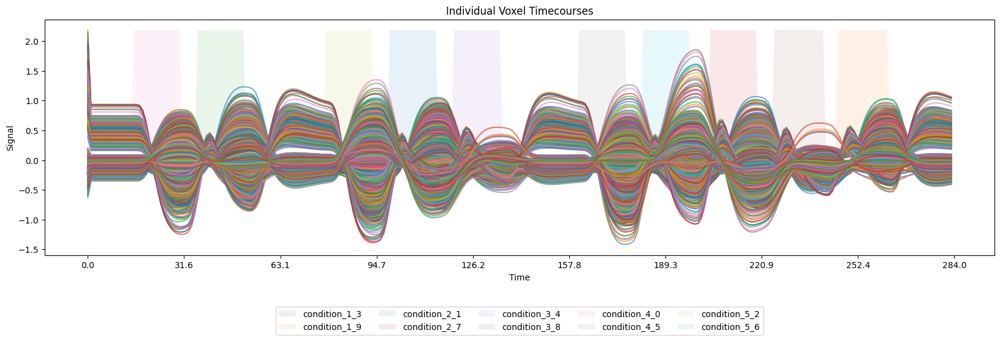

Processing subject 10 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/397760_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/397760_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/397760_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 397760_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/397760_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/397760_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/397760_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1905, 284)


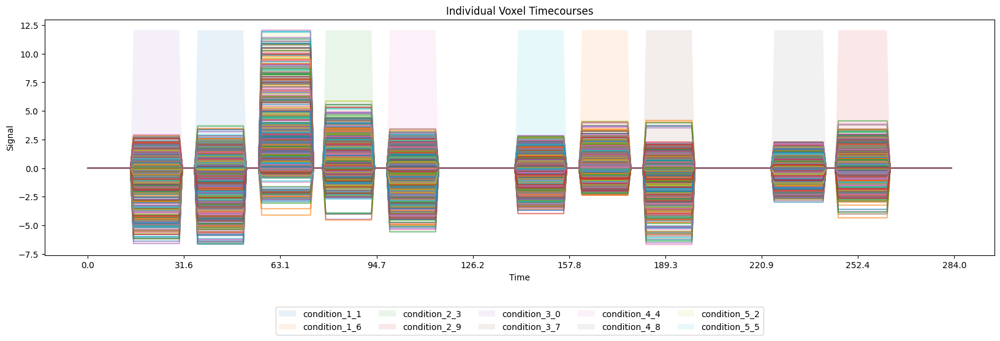

(1905, 284)


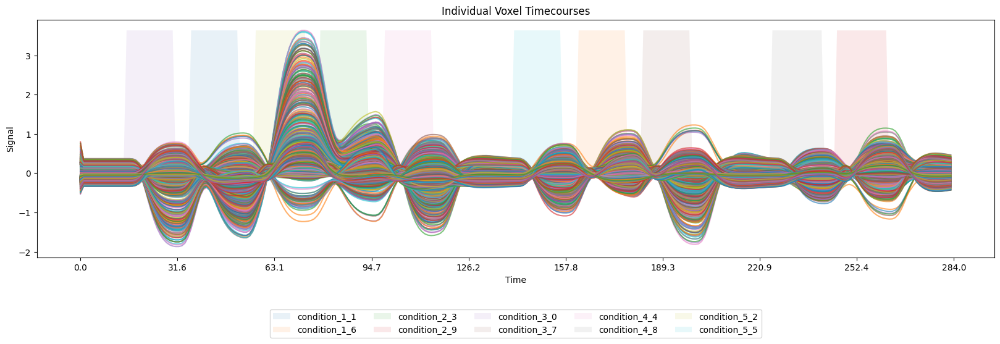

Processing subject 11 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/136833_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/136833_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/136833_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 136833_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/136833_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/136833_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR


/home/silvagni/.conda/envs/ml4science/lib/python3.12/site-packages/nilearn/glm/first_level/first_level.py:707: UserWarning: Mean values of 0 observed. The data have probably been centered.Scaling might not work as expected
  Y, _ = mean_scaling(Y, self.signal_scaling)


computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/136833_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1932, 284)


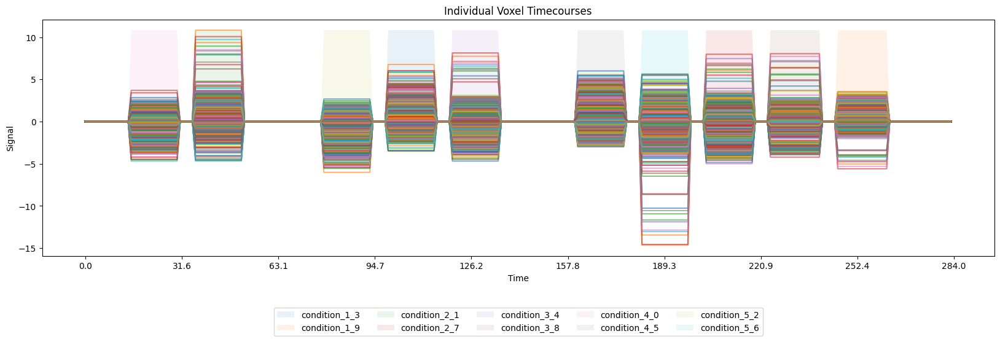

(1932, 284)


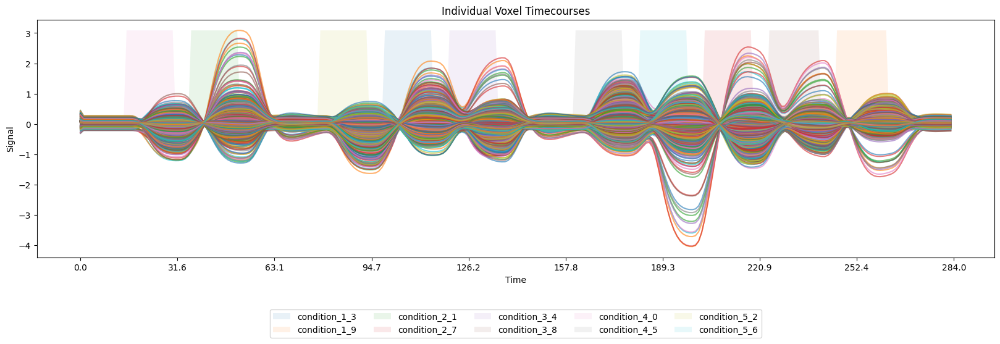

Processing subject 12 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/190031_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/190031_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/190031_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 190031_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/190031_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/190031_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/190031_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1941, 284)


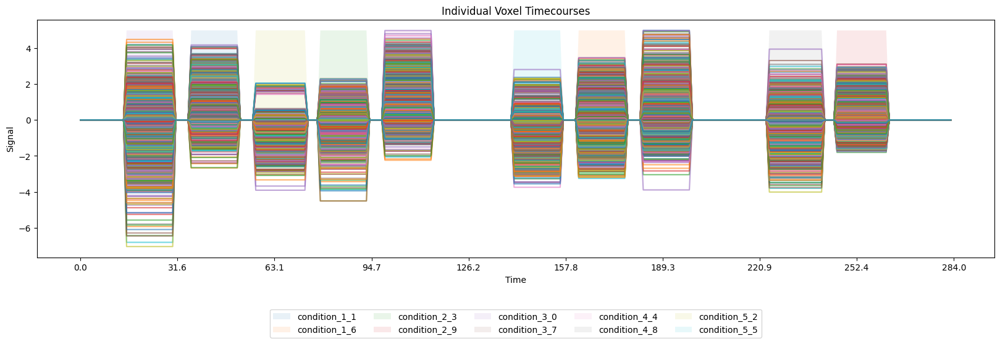

(1941, 284)


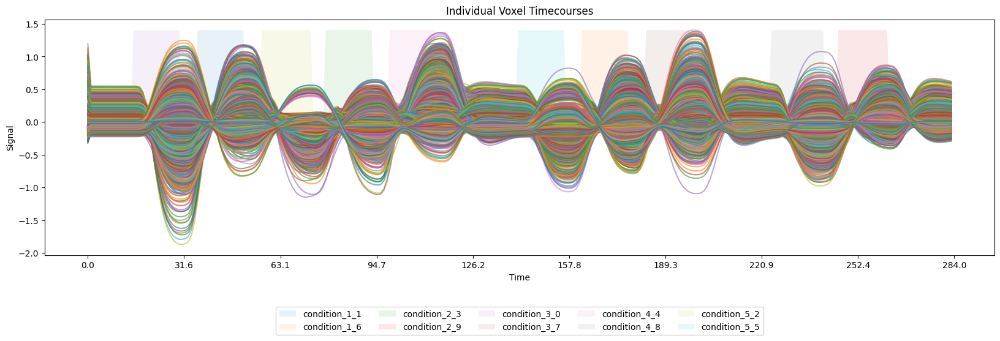

Processing subject 13 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/178950_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/178950_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/178950_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 178950_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/178950_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/178950_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/178950_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1869, 284)


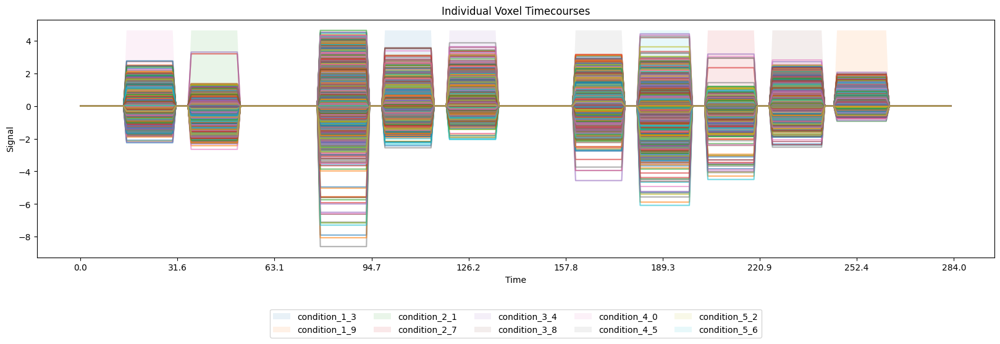

(1869, 284)


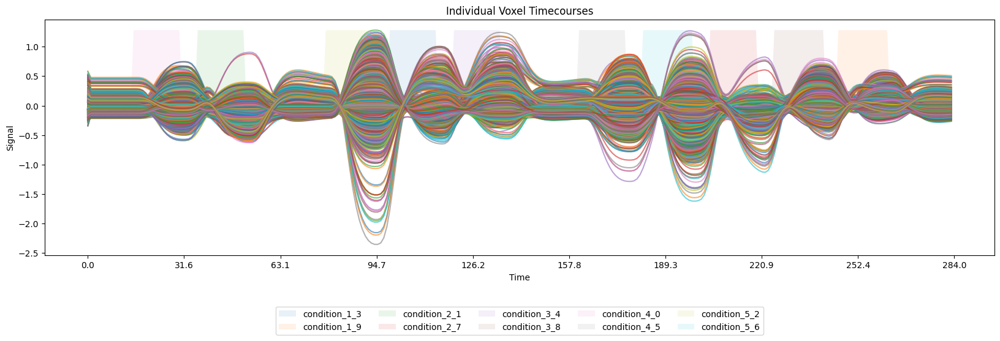

Processing subject 14 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/115320_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/115320_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/115320_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 115320_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/115320_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/115320_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR


/home/silvagni/.conda/envs/ml4science/lib/python3.12/site-packages/nilearn/glm/first_level/first_level.py:707: UserWarning: Mean values of 0 observed. The data have probably been centered.Scaling might not work as expected
  Y, _ = mean_scaling(Y, self.signal_scaling)


computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/115320_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1895, 284)


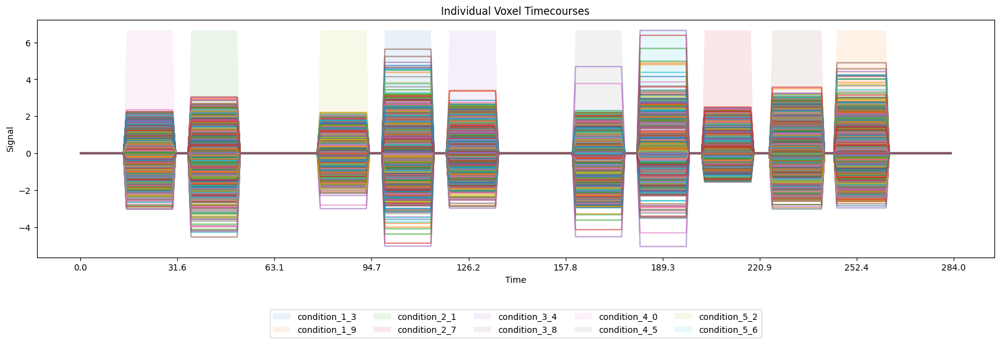

(1895, 284)


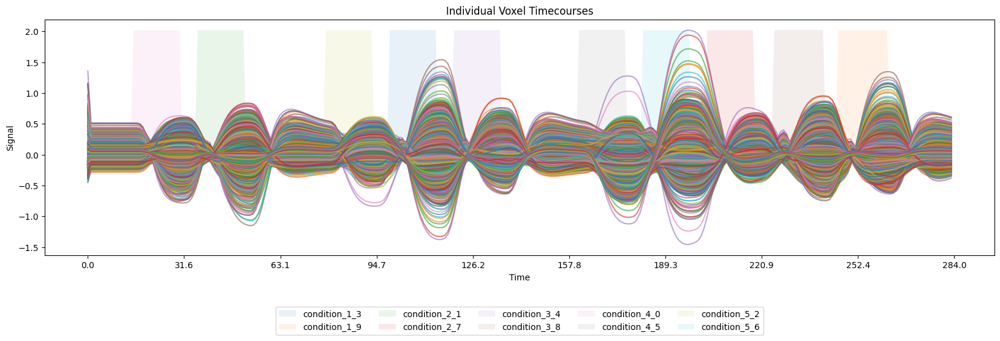

Processing subject 15 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/211417_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/211417_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/211417_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 211417_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/211417_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/211417_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/211417_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1939, 284)


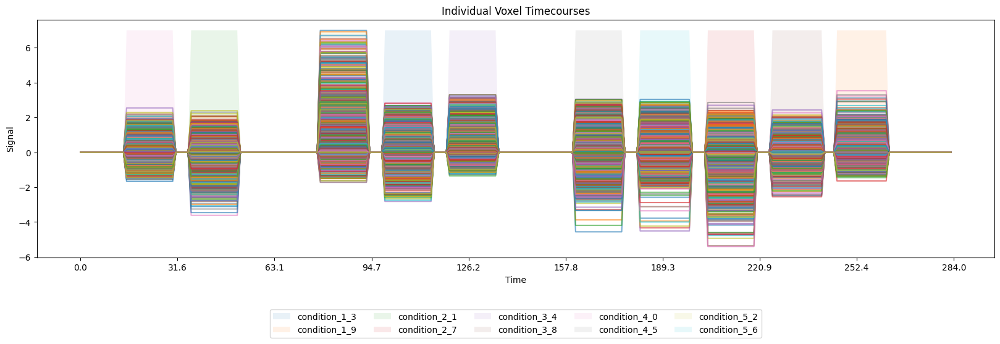

(1939, 284)


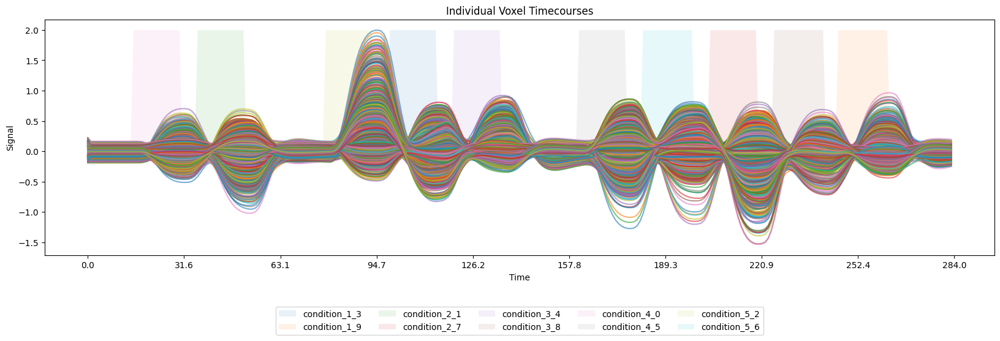

Processing subject 16 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/672756_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/672756_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/672756_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 672756_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/672756_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/672756_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/672756_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1921, 284)


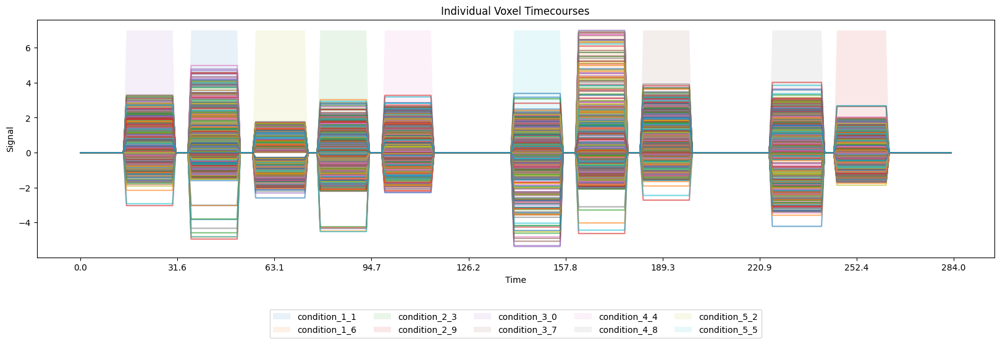

(1921, 284)


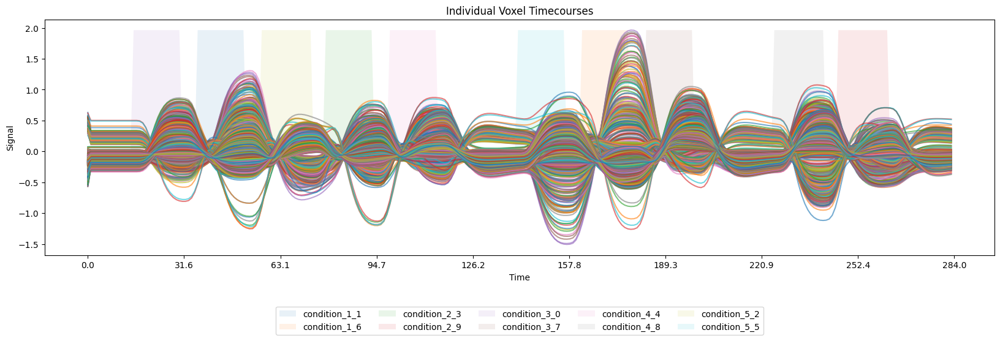

Processing subject 17 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/122620_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/122620_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/122620_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 122620_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/122620_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/122620_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/122620_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1959, 284)


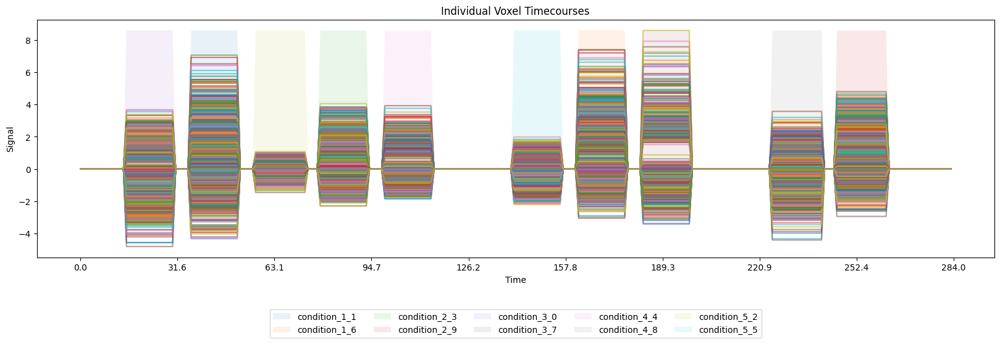

(1959, 284)


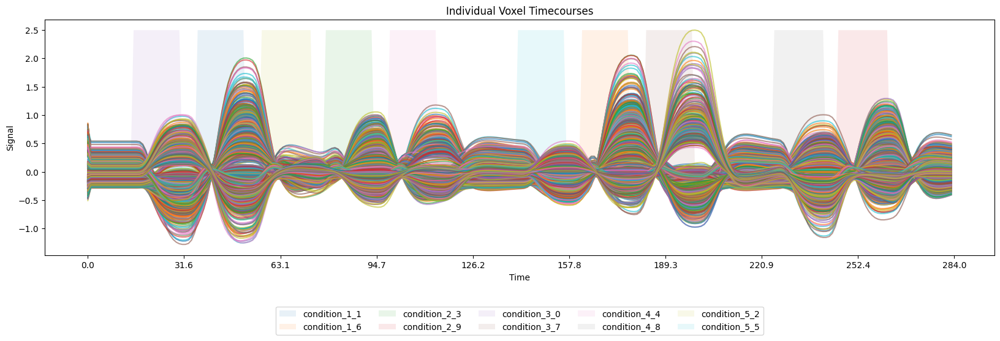

Processing subject 18 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/214423_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/214423_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/214423_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 214423_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/214423_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/214423_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/214423_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1950, 284)


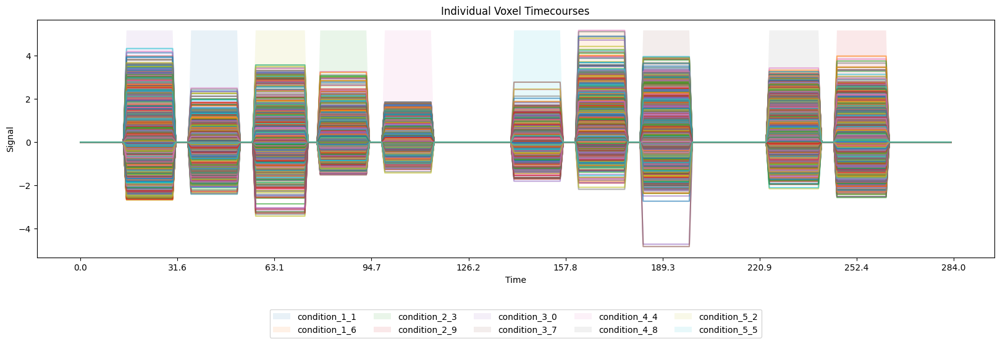

(1950, 284)


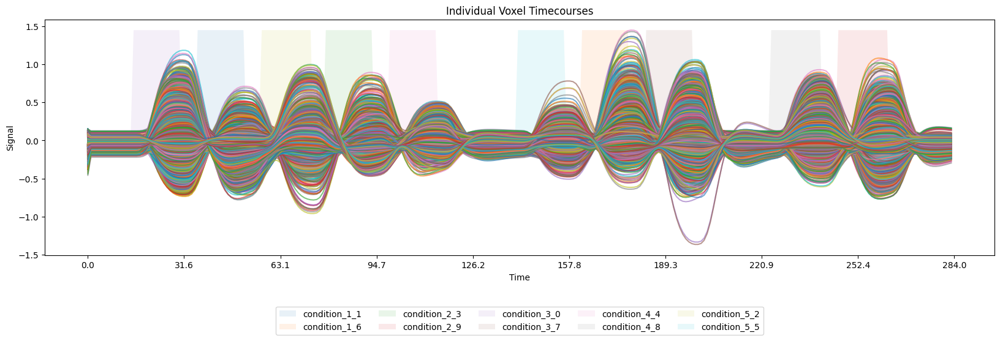

Processing subject 19 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/135932_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/135932_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/135932_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 135932_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/135932_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/135932_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/135932_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1928, 284)


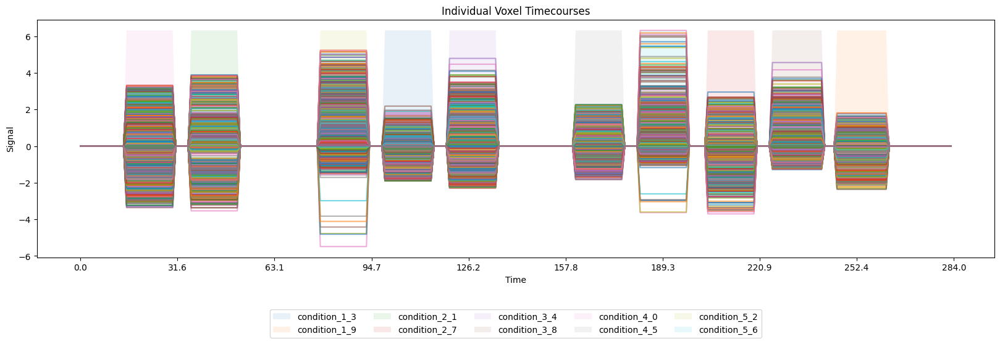

(1928, 284)


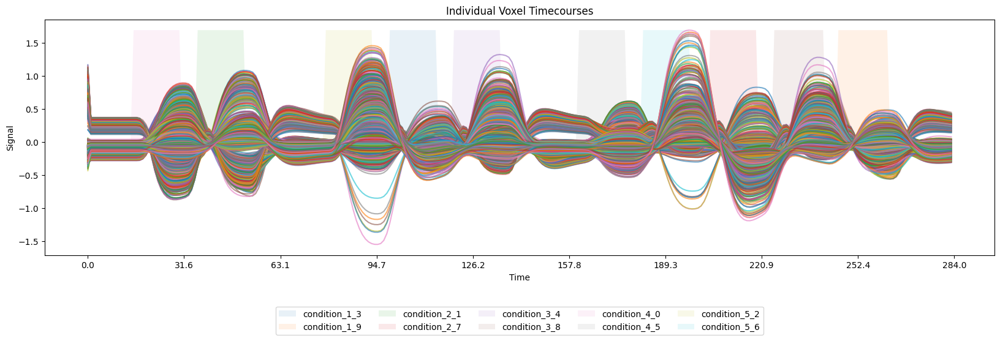

Processing subject 20 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/189450_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/189450_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/189450_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 189450_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/189450_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/189450_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/189450_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1989, 284)


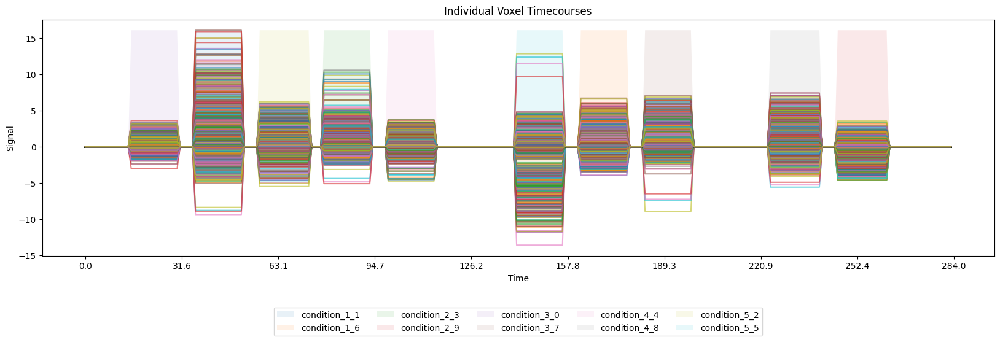

(1989, 284)


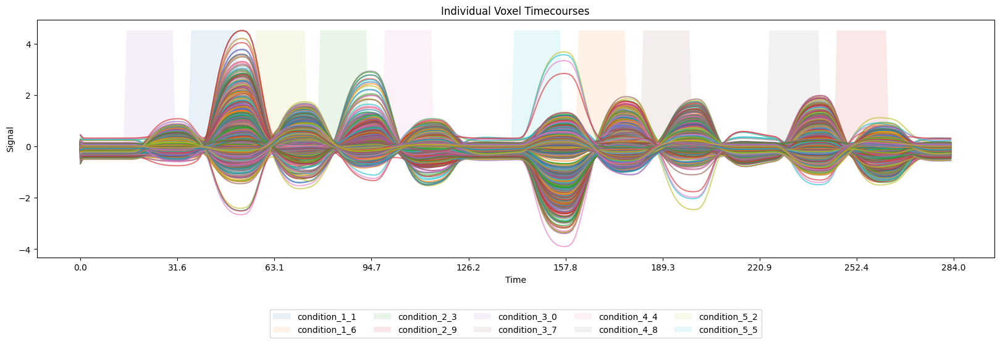

Processing subject 21 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/122317_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/122317_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/122317_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 122317_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/122317_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/122317_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/122317_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1908, 284)


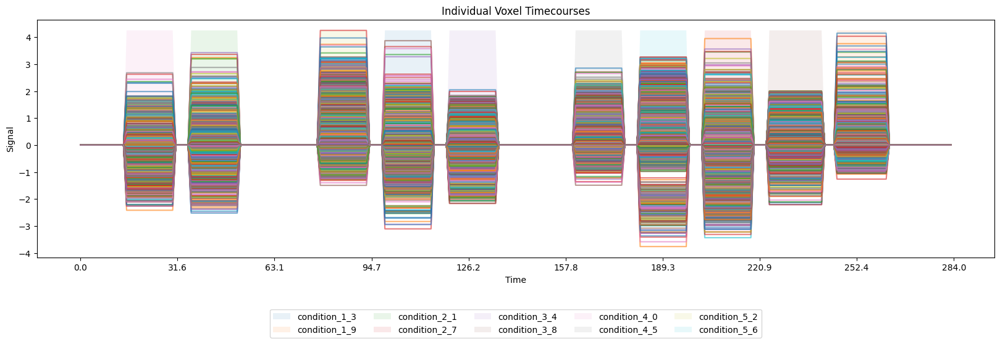

(1908, 284)


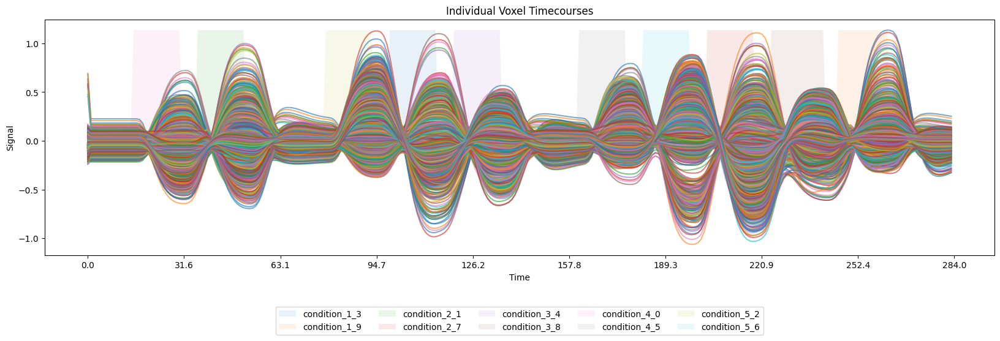

Processing subject 22 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/151627_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/151627_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/151627_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 151627_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/151627_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/151627_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/151627_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1918, 284)


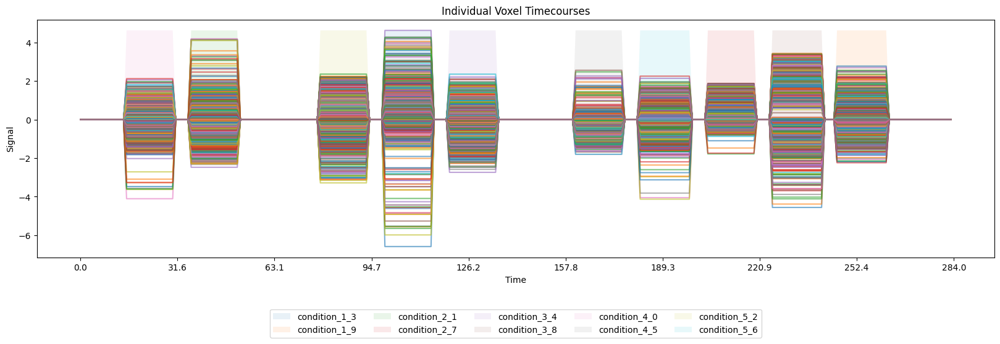

(1918, 284)


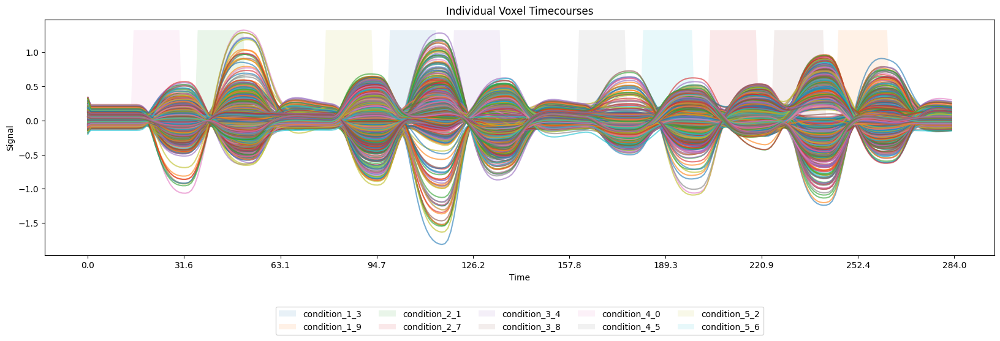

Processing subject 23 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/118528_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/118528_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/118528_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz
files 118528_MOTOR_LR_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/118528_Regressor_tfMRI_MOTOR_LR.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/118528_MOTOR_LR_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/118528_MOTOR_LR_smooth-10mm_fmap.nii.gz
(1931, 284)


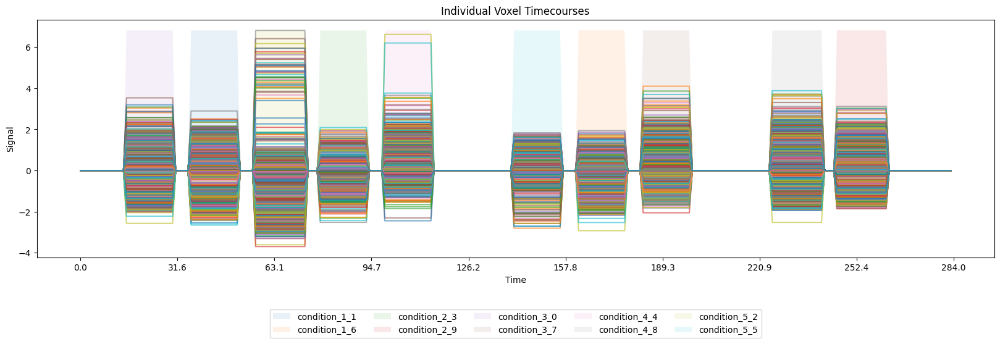

(1931, 284)


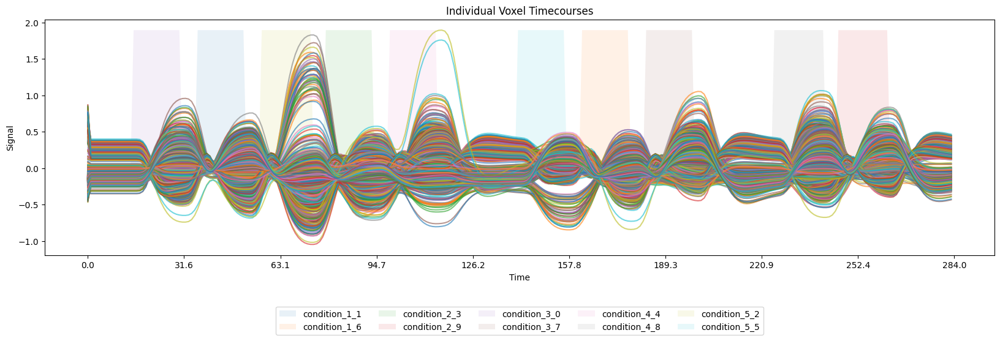

Processing subject 24 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/414229_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/414229_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/414229_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 414229_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/414229_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/414229_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/414229_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1908, 284)


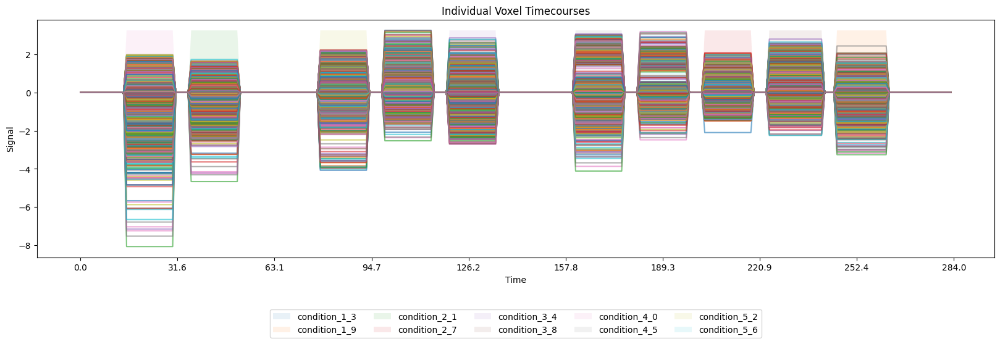

(1908, 284)


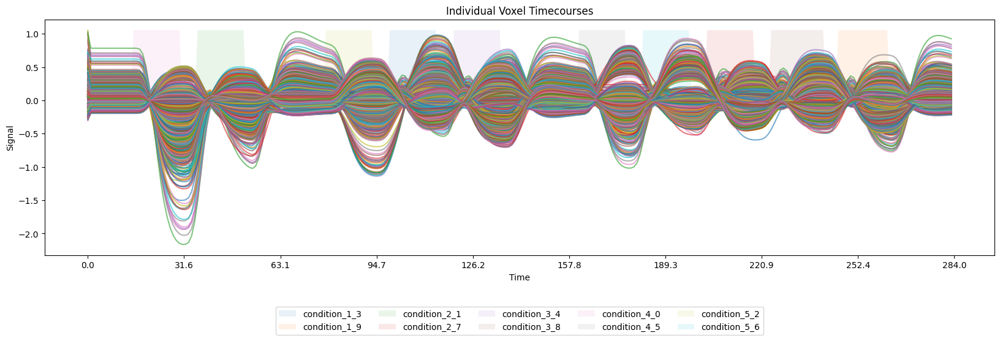

Processing subject 25 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/159340_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/159340_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/159340_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 159340_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/159340_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/159340_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/159340_MOTOR_RL_smooth-10mm_fmap.nii.gz
(1901, 284)


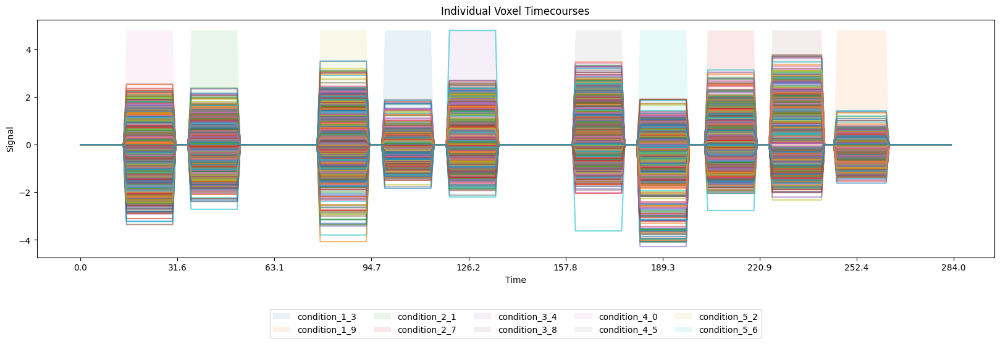

(1901, 284)


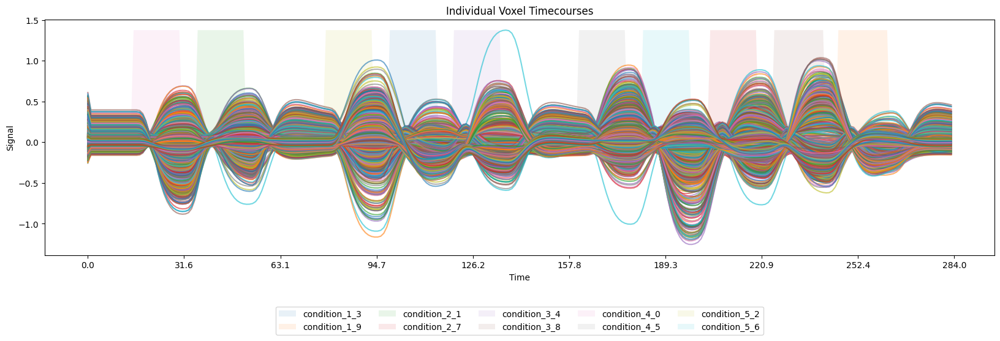

Processing subject 26 out of 60
processing subject gray matter mask /media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/140925_gm_mask.nii.gz
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/anat/140925_gm_mask.nii.gz
concatenating volumes for task MOTOR
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/140925_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz
files 140925_MOTOR_RL_smooth-10mm_fMRIvols.nii.gz already exists, skipping processing
processing event conditions
/media/miplab-nas2/HCP-Data/HCP_100unrelated_TaskParadigms/140925_Regressor_tfMRI_MOTOR_RL.mat
/media/RCPNAS/Data2/CS-433-ML4S/data/events/140925_MOTOR_RL_event.csv
first GLM to select active voxel
fitting GLM for task MOTOR
computing f-map and selecting 98th voxel
/media/RCPNAS/Data2/CS-433-ML4S/data/derivatives/func/140925_MOTOR_RL_smooth-10mm_fmap.nii.gz


KeyboardInterrupt: 

In [16]:
import numpy as np
import xarray as xr
import nibabel as nib

def voxel_activation_glm(mask_img, TR, fmri_vols, events):
    fmri_glm = FirstLevelModel(
        mask_img=mask_img,
        t_r=TR,
        noise_model='ar1', # or ols 
        standardize=False,
        hrf_model='spm',
        drift_model=None, # not necessary, nuisance covariates have already been removed
        minimize_memory=False,
    )

    print(f"fitting GLM for task {task}")
    fitted_glm = fmri_glm.fit(fmri_vols, events)
    return fitted_glm
def prepare_subject_sample(subject, task, acquisition, smoothing, voxel_quantile=98, label_extraction=get_predicted_neural_activity,show=True):
    gm_mask = subject_gm_mask_path(subject)
    print("processing subject gray matter mask", gm_mask)
    process_gray_matter_mask(anat_dir, subject, border_size=2, save=True, plot=False)

    print(f"concatenating volumes for task {task}")
    fmri_vols = create_4d_volume(subject, task, acquisition, smoothing, save=True)

    print("processing event conditions")
    events = create_events_df(subject, task, acquisition)

    regressors = scipy.io.loadmat(subject_task_regressor_path(subject, task, acquisition))
    regressors_ts = regressors['Regressor'].flatten()
    bdesign_matrix = binary_design_matrix(events, TR, fmri_vols.shape[-1])

    print("first GLM to select active voxel")
    activity_glm = voxel_activation_glm(gm_mask, TR, fmri_vols, events)
    
    n_regressors = activity_glm.design_matrices_[0].shape[1]
    n_conditions = n_regressors - 1 # drop constant regressor

    print(f"computing f-map and selecting {voxel_quantile}th voxel")
    contrast_matrix = np.eye(n_conditions, n_regressors)
    
    fmap = compute_task_fmap(subject, task, acquisition, smoothing, activity_glm, contrast_matrix)
    threshold = compute_bins_threshold(fmap, n_perc=voxel_quantile, show=False)
    if show:
        plot_fmap(fmap, threshold, display_mode="x", task=task, info={"subj": subject}, cut_cords=x_coords)
        plot_fmap(fmap, threshold, display_mode="y", task=task, info={"subj": subject}, cut_cords=y_coords)
        plot_fmap(fmap, threshold, display_mode="z", task=task, info={"subj": subject}, cut_cords=z_coords)

    gm_mask = nib.load(gm_mask)
    active_mask = create_active_voxel_mask(subject, task, acquisition, smoothing, voxel_quantile, gm_mask, fmap, threshold)
    active_mask_data = active_mask.get_fdata()
    
    return label_extraction(activity_glm, active_mask_data, bdesign_matrix,fmri_vols.get_fdata())

# Initialize an empty list to store datasets
datasets = []
i=0
for entry in subjects_kept:
    print(f"Processing subject {i} out of {len(subjects_kept)}")
    i=i+1
    subject_id = str(entry['id'])
    acquisition = entry['acquisition']
    task = entry['task']
    
    #X_list, Y_list = prepare_subject_sample(subject_id, task, acquisition, smoothing, voxel_quantile=98, labeled_sample_extraction=get_predicted_neural_activity , show=False)
    X_list, Y_list, Y_conv_list = prepare_subject_sample(subject_id, task, acquisition, smoothing, voxel_quantile=98, label_extraction=get_block_and_neural_activity , show=False)


    # Create an xarray Dataset for this subject
    dataset = xr.Dataset(
        {
            'X': (['voxel', 'time'], X_list),  # Original timeseries
            'Y': (['voxel', 'time'], Y_list),  # Predicted timeseries
            'Y_conv': (['voxel', 'time'], Y_conv_list),  # Predicted timeseries

        },
        coords={
            'subject': f"{subject_id}_{acquisition}",
            'task': task,
            'voxel': np.arange(X_list.shape[0]),
            'time': np.arange(X_list.shape[1]),
        },
        attrs={
            'description': f'Dataset for subject {subject_id}, task {task}, acquisition {acquisition}'
        }
    )

    # Append the dataset to the list
    datasets.append(dataset)

# Combine datasets into one large xarray Dataset along the 'subject' dimension
final_dataset = xr.concat(datasets, dim='subject', fill_value=np.nan)


In [ ]:
# Save to file
final_dataset.to_netcdf(pjoin(derivatives_dir,f'dataset_{task}_{len(subjects_kept)}_subjects_both.nc'))

In [17]:
subject_id = 118932
final_dataset = xr.open_dataset(pjoin(derivatives_dir,f'dataset_MOTOR_60_subjects_block.nc'))
# Access the dataset for the given subject
subject_data = final_dataset.sel(subject=subject_id)

# Access the X (BOLD) and Y (Predicted) time series for all voxels of the subject
X_subject = subject_data['X']  # Shape: [voxel, time]
Y_subject = subject_data['Y']  # Shape: [voxel, time]

# To access a specific voxel's time series, e.g., voxel 0
X_voxel_0 = X_subject.isel(voxel=0)  # Time series for voxel 0
Y_voxel_0 = Y_subject.isel(voxel=0)

KeyError: "not all values found in index 'subject'. Try setting the `method` keyword argument (example: method='nearest')."

In [ ]:
plt.plot(X_voxel_0-np.mean(X_voxel_0))
plt.plot(Y_voxel_0*150)
plt.show()

In [ ]:
subject_id=211417
acquisition='RL'
subject_data = final_dataset.sel(subject=subject_id)

## OLD

In [ ]:
sample_prefix = subject_task_sample_prefix("113619", "MOTOR", "LR", 10, 98)
print(sample_prefix)

def load_and_reconstruct_volume(prefix, vol_shape=(91, 109, 91)):
    X_files = sorted(glob(f"{prefix}X_*.npy"))
    Y_files = sorted(glob(f"{prefix}Y_*.npy"))
    
    # Load first file to get timepoints dimension
    first_X = np.load(X_files[0])
    n_timepoints = first_X.shape[0]
    
    flat_X = np.vstack([np.load(f) for f in X_files])
    flat_Y = np.vstack([np.load(f) for f in Y_files])
    
    mask = np.zeros(vol_shape)
    voxel_coords = np.where(mask.flatten() != 0)
    
    X_vol = np.zeros((*vol_shape, n_timepoints))
    Y_vol = np.zeros((*vol_shape, n_timepoints))
    
    X_vol.reshape(-1, n_timepoints)[voxel_coords] = flat_X
    Y_vol.reshape(-1, n_timepoints)[voxel_coords] = flat_Y
    
    return X_vol, Y_vol

In [ ]:
X_vol, Y_vol = load_and_reconstruct_volume(sample_prefix)

In [ ]:
X_loaded

In [ ]:
x = np.load('/media/RCPNAS/Data2/CS-433-ML4S/dataset/113619_MOTOR_LR_smooth-10mm_98_X_0949.npy')

In [ ]:
x.shape

In [ ]:
def create_labeled_sample(bold_data, predicted_data, active_mask_data):
    """
    Return labeled sample as X_list,Y_list 
    """
    voxel_coords = np.array(np.where(active_mask_data > 0)).T
    print("bold shape", bold_data.shape)
    print("predicted shape", predicted_data.shape)
    print("mask shape", active_mask_data.shape)
    print("voxel mask shape",voxel_coords.shape)
    # Initialize X_list and Y_list as lists
    X_list = []
    Y_list = []

    # Loop over each voxel to extract its time series
    for voxel in voxel_coords:
        # Extract the time series for the voxel in both BOLD and predicted data
        x_voxel = bold_data[voxel[0], voxel[1], voxel[2], :]  # Extract time series for this voxel in BOLD data
        y_voxel = predicted_data[voxel[0], voxel[1], voxel[2], :]  # Extract time series for this voxel in predicted data
        
        # Append the time series for the voxel to X_list and Y_list
        X_list.append(x_voxel)
        Y_list.append(y_voxel)

    # Convert lists to numpy arrays for further processing
    X_list = np.array(X_list)  # Shape: [num_voxels, time_points]
    Y_list = np.array(Y_list)  # Shape: [num_voxels, time_points]

    return X_list, Y_list, voxel_coords